# **Uber Data Analysis Project**

*Data from Uber pickups in New York City in 2014 April-Septiember period.*

`Author: Daniel Conesa`

Se importan librerías necesarias y el dataset

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('ggplot') #Similar to R style

uber_data = pd.read_csv('uber-data-aprsept14.csv')
uber_data = uber_data.drop(['Unnamed: 0'], axis=1)
uber_data.head()

,Date/Time,Lat,Lon,Base,Day,Month,Hour,Minute,Weekday
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512,1,4,0,11,1
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512,1,4,0,17,1
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512,1,4,0,21,1
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512,1,4,0,28,1
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512,1,4,0,33,1


Los datos inicialmente se encontraban en 4 csv, uno por mes con tan solo las 4 primeras columnas. Se han procesado separando el resto de datos y uniendo toda la información en un único dataset

In [2]:
week = ['Lunes', 'Martes', 'Miercoles', 'Jueves', 'Viernes', 'Sabado', 'Domingo']
months = ['Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre']

uber_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534327 entries, 0 to 4534326
Data columns (total 9 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
 4   Day        int64  
 5   Month      int64  
 6   Hour       int64  
 7   Minute     int64  
 8   Weekday    int64  
dtypes: float64(2), int64(5), object(2)
memory usage: 311.3+ MB


Con mas de 4 millones de datos y 300MB se puede comprobar que existe una gran cantidad de información

## Data Visualization

**Viajes por hora y mes**

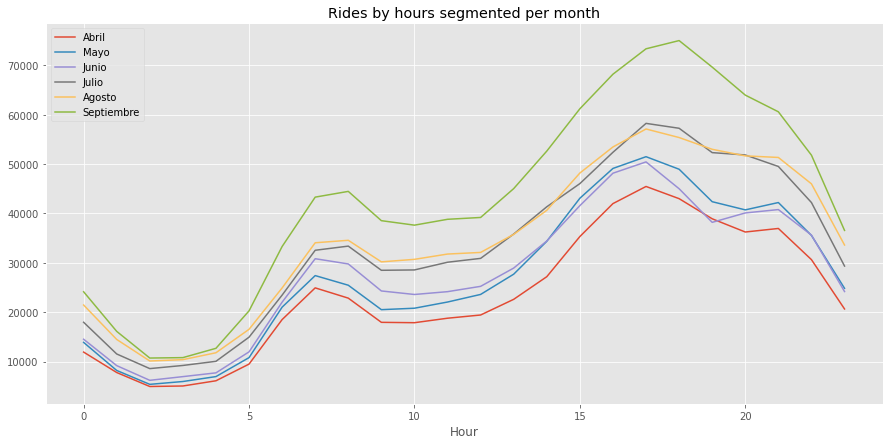

In [3]:
fig, ax = plt.subplots(figsize=(15,7))
uber_data.groupby(['Hour','Month'], sort=False).count()['Base'].unstack().plot(ax=ax)

plt.title('Rides by hours segmented per month')
plt.legend(labels = months)
plt.show()

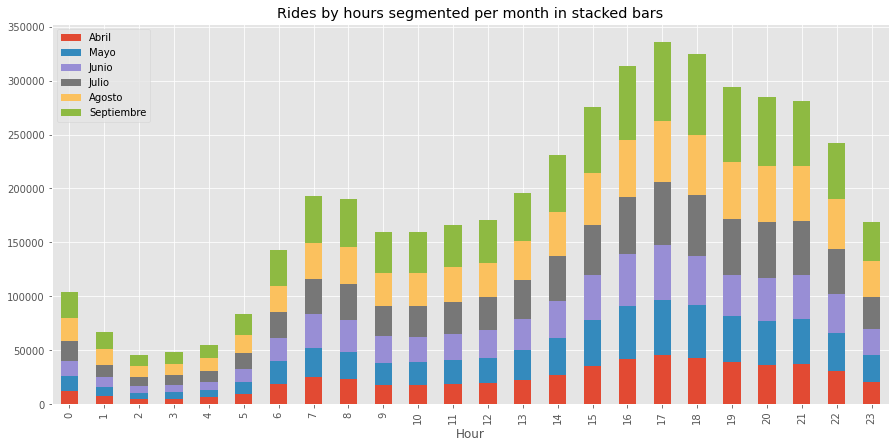

In [4]:
fig, ax = plt.subplots(figsize=(15,7))
uber_data.groupby(['Hour','Month'], sort=False).count()['Base'].unstack().plot(kind='bar', ax=ax, stacked=True)

plt.title('Rides by hours segmented per month in stacked bars')
plt.legend(labels = months)
plt.show()

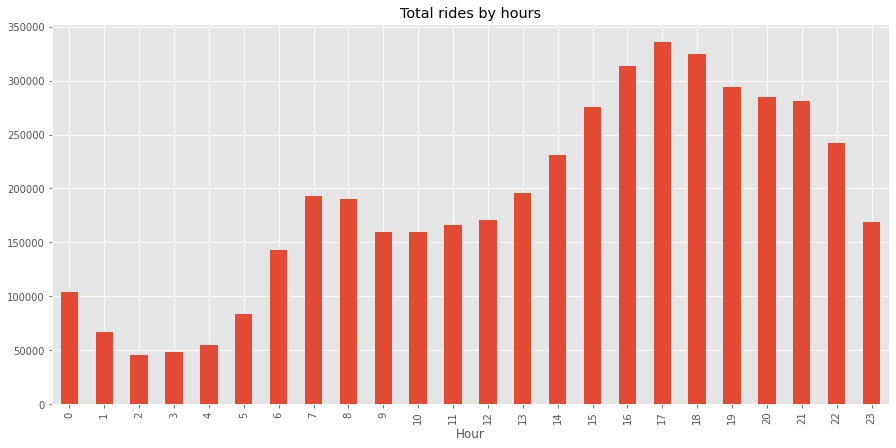

In [5]:
fig, ax = plt.subplots(figsize=(15,7))
uber_data.groupby(['Hour'], sort=False).count()['Base'].plot(kind='bar', ax=ax)

plt.title('Total rides by hours')
plt.show()

Se puede observar que en la madrugada los viajes son mínimos, mientras que por la tarde es cuando se alcanzan los picos máximos pasando por un valle a media mañana.

De hecho, los picos se alcanzan en las franjas de entrada/salida del trabajo.

**Viajes por días**

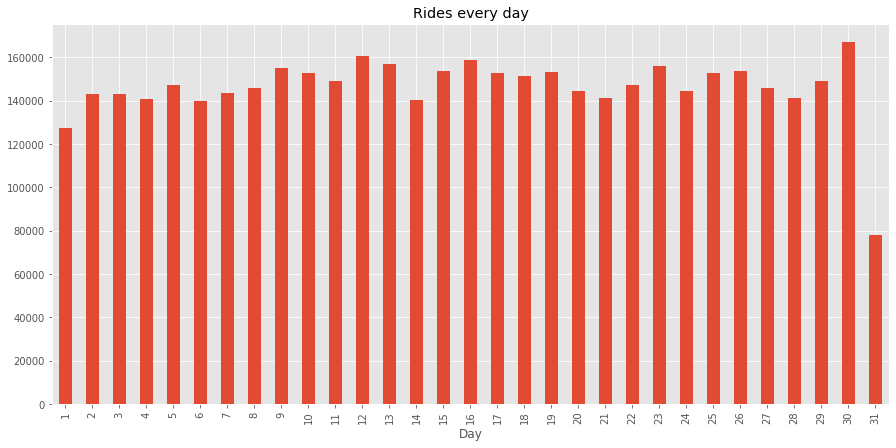

In [6]:
fig, ax = plt.subplots(figsize=(15,7))

uber_data.groupby(['Day'], sort=False).count()['Base'].plot(kind='bar',ax=ax)

plt.title('Rides every day')
plt.show()

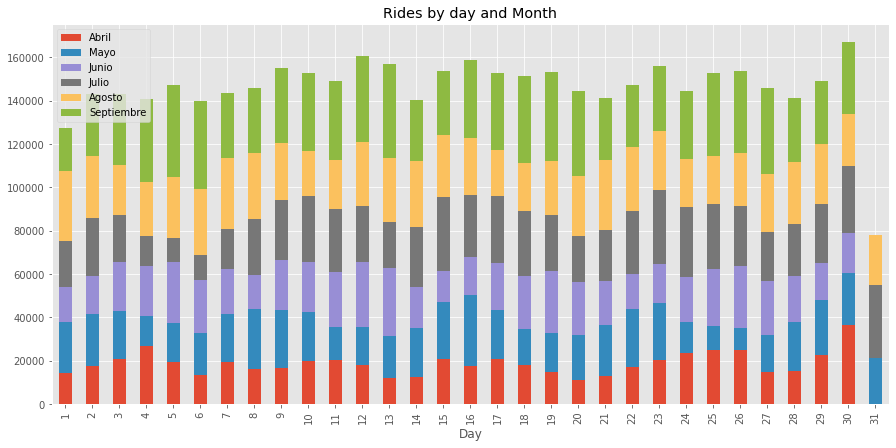

In [7]:
fig, ax = plt.subplots(figsize=(15,7))

uber_data.groupby(['Day','Month'], sort=False).count()['Base'].unstack().plot(kind='bar',ax=ax, stacked=True)

ax.legend(months)
plt.title('Rides by day and Month')
plt.show()

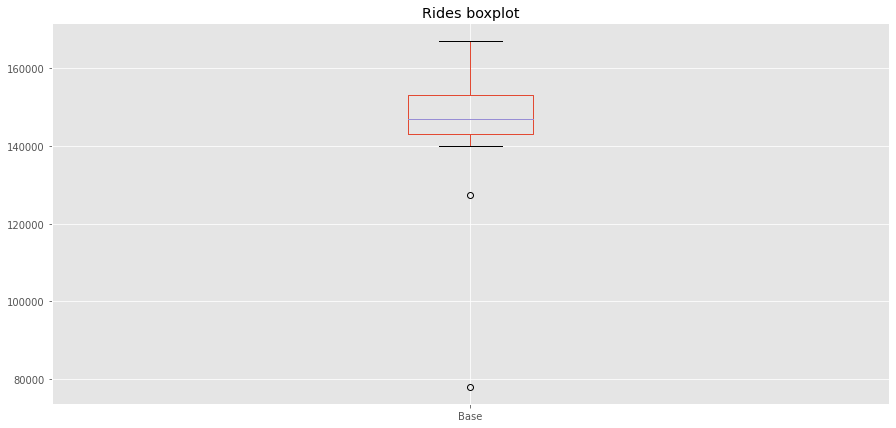

In [8]:
fig, ax = plt.subplots(figsize=(15,7))
uber_data.groupby(['Day'], sort=False).count().boxplot(column=['Base'], ax=ax)
plt.title('Rides boxplot')
plt.show()

Como era de esperar, los días 31 tienen menor volumen general ya que no todos los meses tienen este día. El resto de días a priori presentan valores "uniformes". Posible presencia de kurtosis y sesgo.

**Viajes por día de semana y mes**

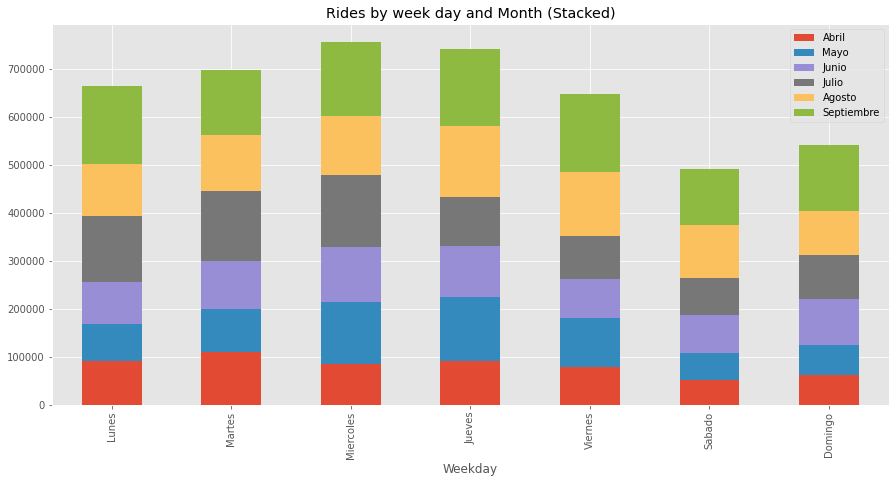

In [9]:
fig, ax = plt.subplots(figsize=(15,7))

uber_data.groupby(['Weekday','Month'], sort=False).count()['Base'].unstack().plot(kind='bar',ax=ax, stacked=True)
ax.set_xticklabels(week)
ax.legend(months)
plt.title('Rides by week day and Month (Stacked)')
plt.show()

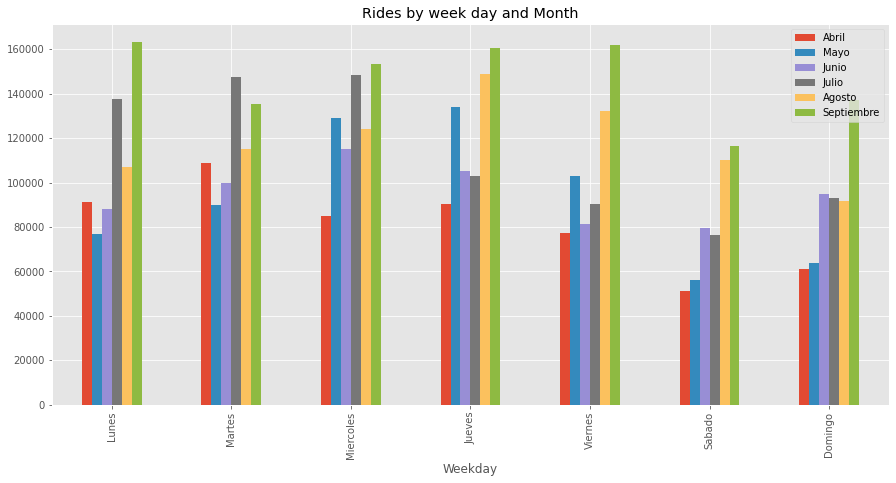

In [10]:
fig, ax = plt.subplots(figsize=(15,7))

uber_data.groupby(['Weekday','Month'], sort=False).count()['Base'].unstack().plot(kind='bar',ax=ax, stacked=False)
ax.set_xticklabels(week)
ax.legend(months)
plt.title('Rides by week day and Month')
plt.show()

Los días entre semana suelen tener mas viajes en general que los días de fin de semana

**Viajes por meses**

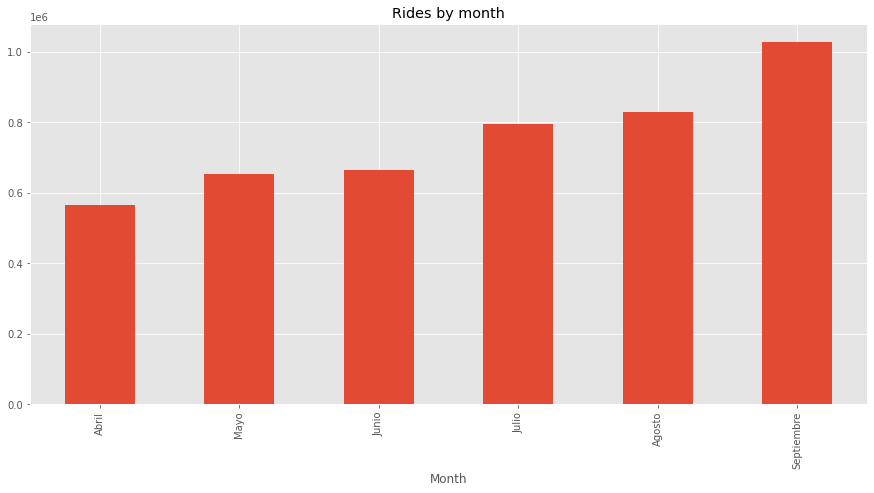

In [11]:
fig, ax = plt.subplots(figsize=(15,7))

uber_data.groupby(['Month'], sort=False).count()['Base'].plot(kind='bar',ax=ax)
ax.set_xticklabels(months)
plt.title('Rides by month')
plt.show()

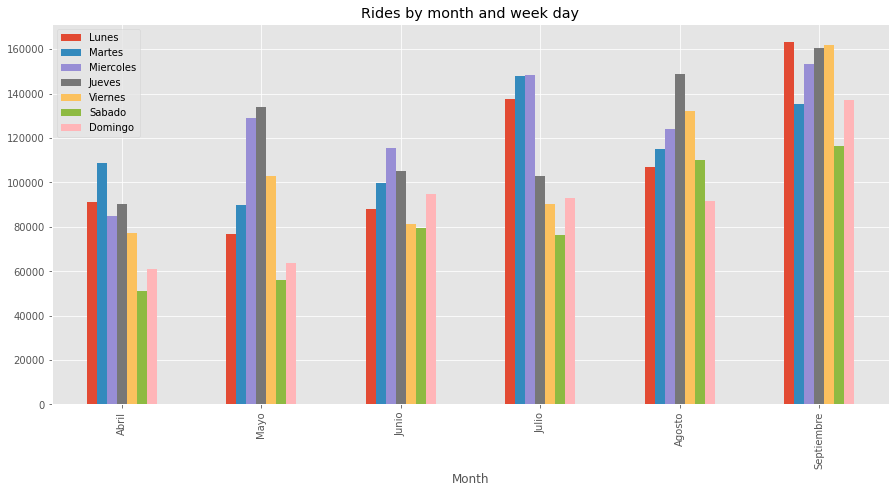

In [12]:
fig, ax = plt.subplots(figsize=(15,7))

uber_data.groupby(['Month','Weekday'], sort=False).count()['Base'].unstack().plot(kind='bar',ax=ax, stacked=False)
ax.set_xticklabels(months)
ax.legend(week)
plt.title('Rides by month and week day')
plt.show()

Los viajes aumentan mes a mes, el sector está en crecimiento.
Los mejores días suelen ser los jueves y los lunes.

**Viajes por bases**

*Las bases son de Nueva York, cada vehículo de uber está asociado a una de estas bases de la Taxi and Limousine Commission*

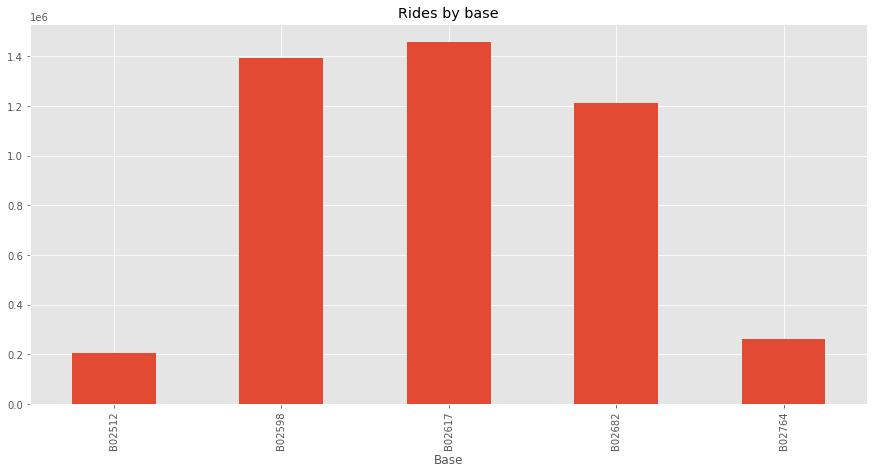

In [13]:
Bases = ['B02512', 'B02598', 'B02617', 'B02682', 'B02764']

fig, ax = plt.subplots(figsize=(15,7))

uber_data.groupby(['Base'], sort=False).count()['Hour'].plot(kind='bar',ax=ax)
plt.title('Rides by base')
plt.show()

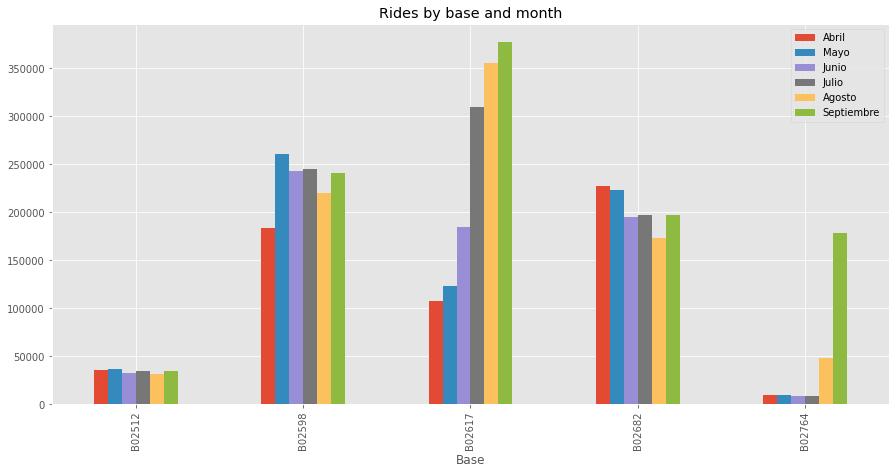

In [14]:
fig, ax = plt.subplots(figsize=(15,7))

uber_data.groupby(['Base', 'Month'], sort=False).count()['Hour'].unstack().plot(kind='bar',ax=ax)

plt.title('Rides by base and month')
plt.legend(months)
plt.show()

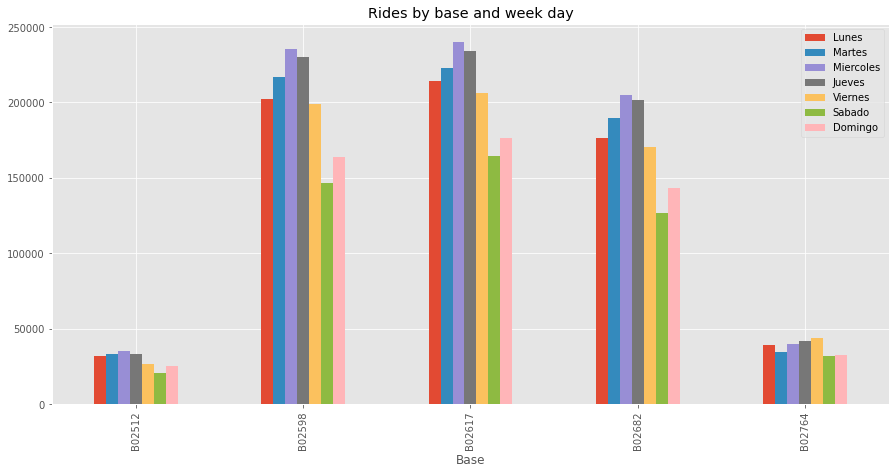

In [15]:
fig, ax = plt.subplots(figsize=(15,7))

uber_data.groupby(['Base', 'Weekday'], sort=False).count()['Hour'].unstack().plot(kind='bar',ax=ax)

plt.title('Rides by base and week day')
plt.legend(week)
plt.show()

En general las bases B02598 (Hinter), B02682 (Schmecken) y B02617 (Weiter) han presentado un mayor número de viajes, especialmente esta última es la que ha experimentado un mayor crecimiento en los últimos meses.

**Visualización de la información a través de mapas de calor**

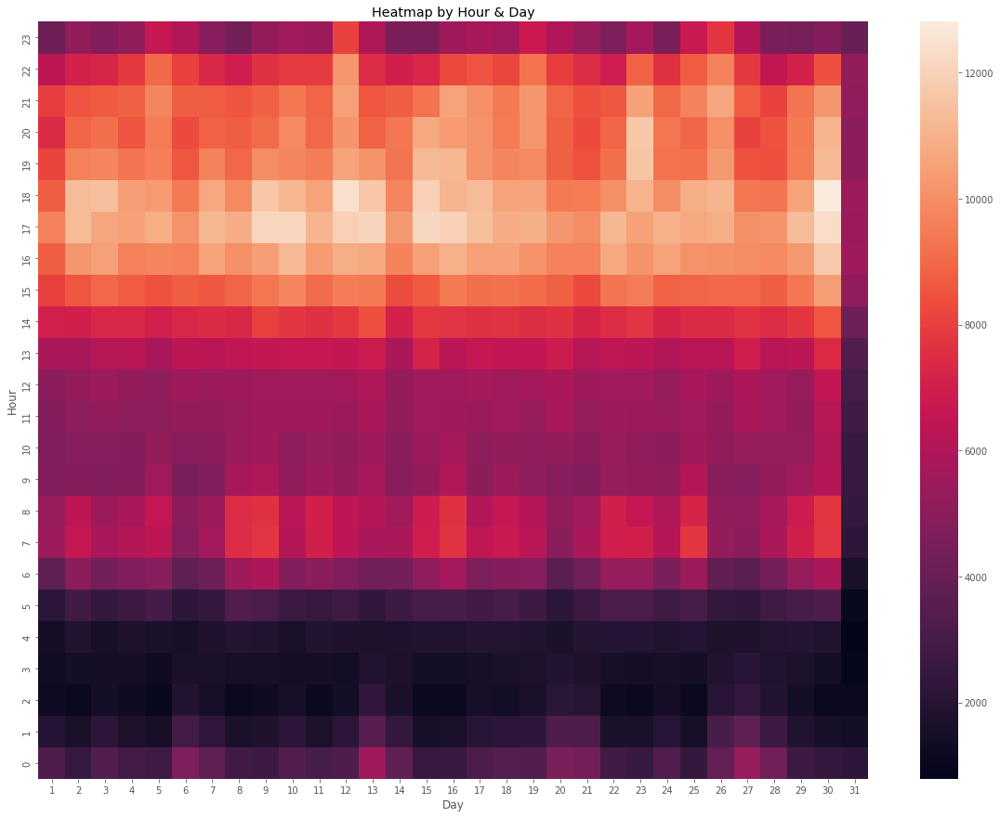

In [16]:
fig, ax = plt.subplots(figsize=(20,15))
ax = sns.heatmap(uber_data.groupby(['Hour', 'Day'], sort=False).count()['Base'].unstack(), annot=False, fmt="d")
ax.invert_yaxis()
plt.title('Heatmap by Hour & Day')
plt.show()

Los mapas de calor permiten representar la información con intensidades de color, permitiendo identificar con rapidez las zonas con mayor concentración de la información. Como se observa, la mayor concentración de viajes se tiene por la tarde, en las horas finales del día, seguido de la franja horaria de entrada al trabajo

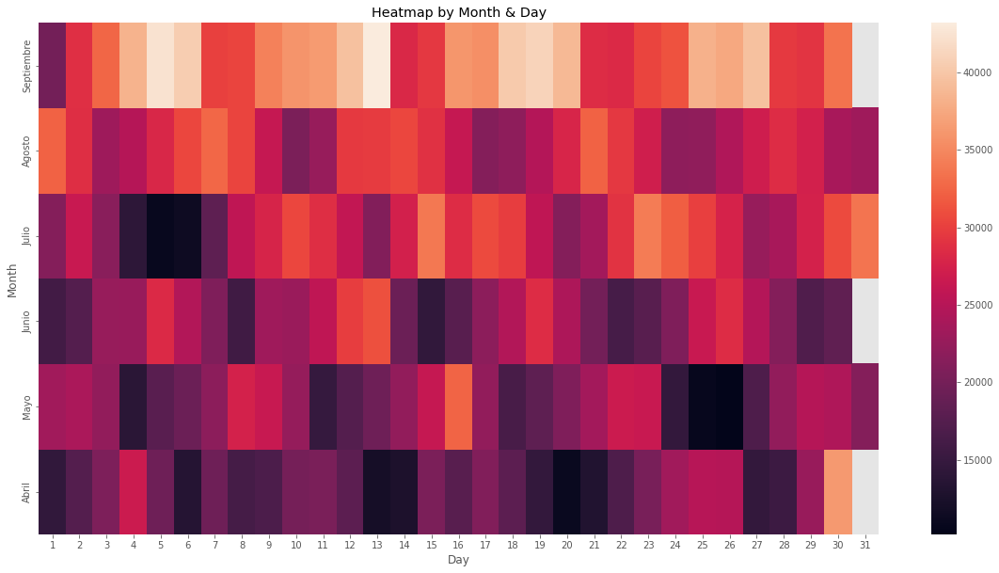

In [17]:
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.heatmap(uber_data.groupby(['Month', 'Day'], sort=False).count()['Base'].unstack(), annot=False, fmt="d")
ax.invert_yaxis()
ax.set_yticklabels(months)
plt.title('Heatmap by Month & Day')
plt.show()

Como se ha comentado, conforme han pasado los meses se ha incrementado el uso del servicio y el número de viajes.

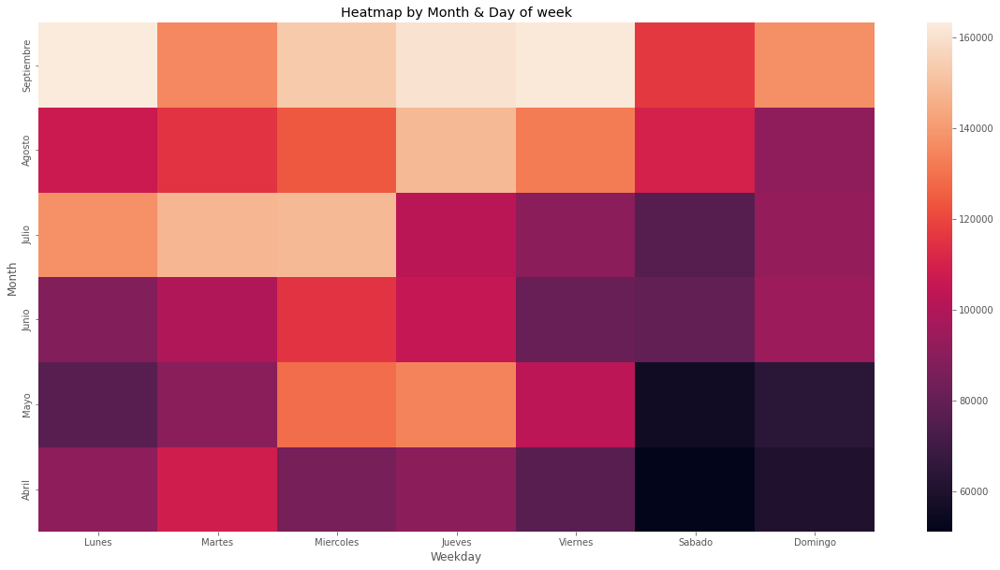

In [18]:
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.heatmap(uber_data.groupby(['Month', 'Weekday'], sort=False).count()['Base'].unstack(), annot=False, fmt="d")
ax.invert_yaxis()
ax.set_yticklabels(months)
ax.set_xticklabels(week)
plt.title('Heatmap by Month & Day of week')
plt.show()

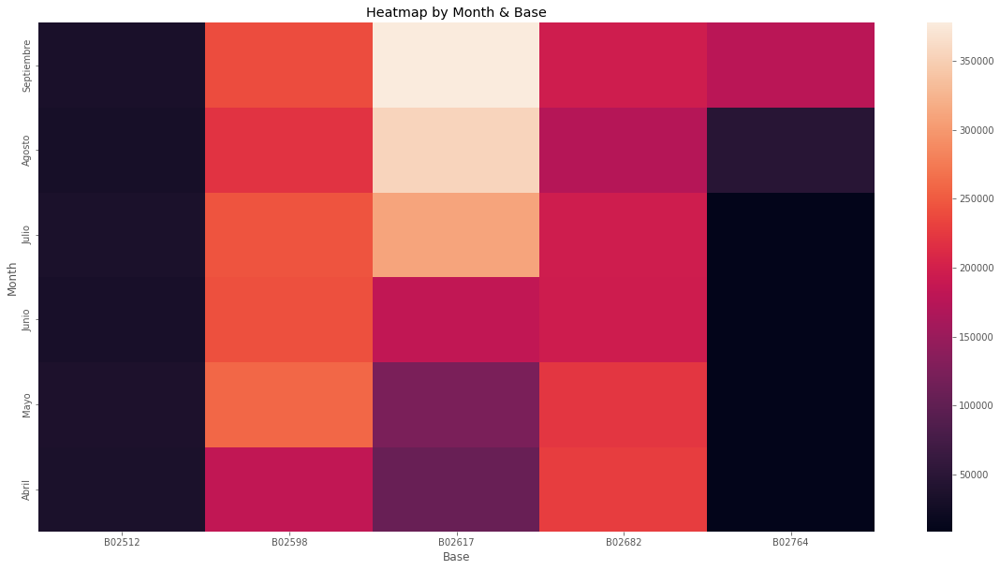

In [19]:
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.heatmap(uber_data.groupby(['Month', 'Base'], sort=False).count()['Day'].unstack(), annot=False, fmt="d")
ax.invert_yaxis()
ax.set_yticklabels(months)
plt.title('Heatmap by Month & Base')
plt.show()

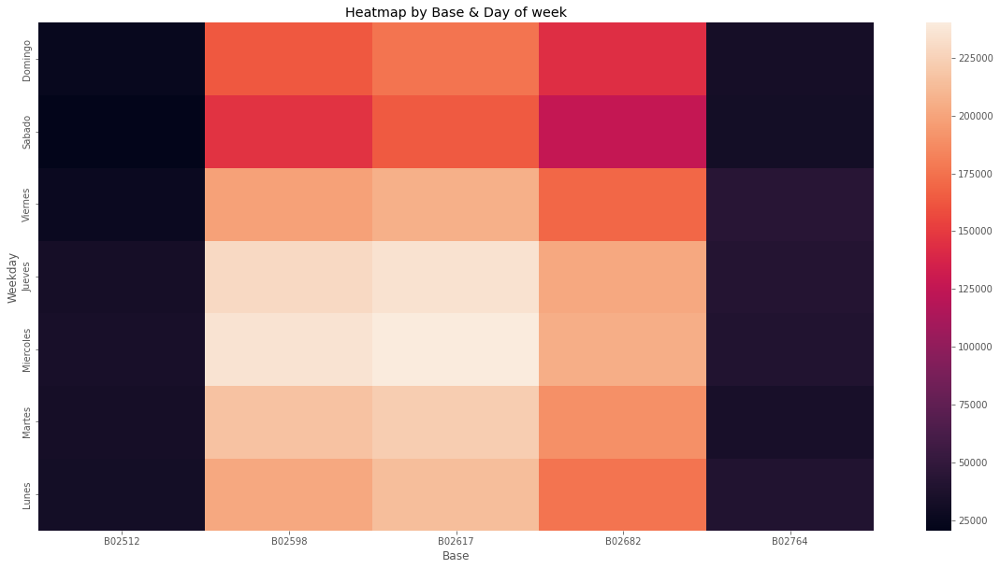

In [20]:
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.heatmap(uber_data.groupby(['Weekday', 'Base'], sort=False).count()['Day'].unstack(), annot=False, fmt="d")
ax.invert_yaxis()
ax.set_yticklabels(week)
plt.title('Heatmap by Base & Day of week')
plt.show()

Las bases que mejor funcionan presentan una mayor concentración de trabajo entre semana.

**Representación de las zonas de recogida para construir un mapa de la ciudad de Nueva York**

In [21]:
min_lat = 40.5774
max_lat = 40.9176
min_lon = -74.15
max_lon = -73.7004

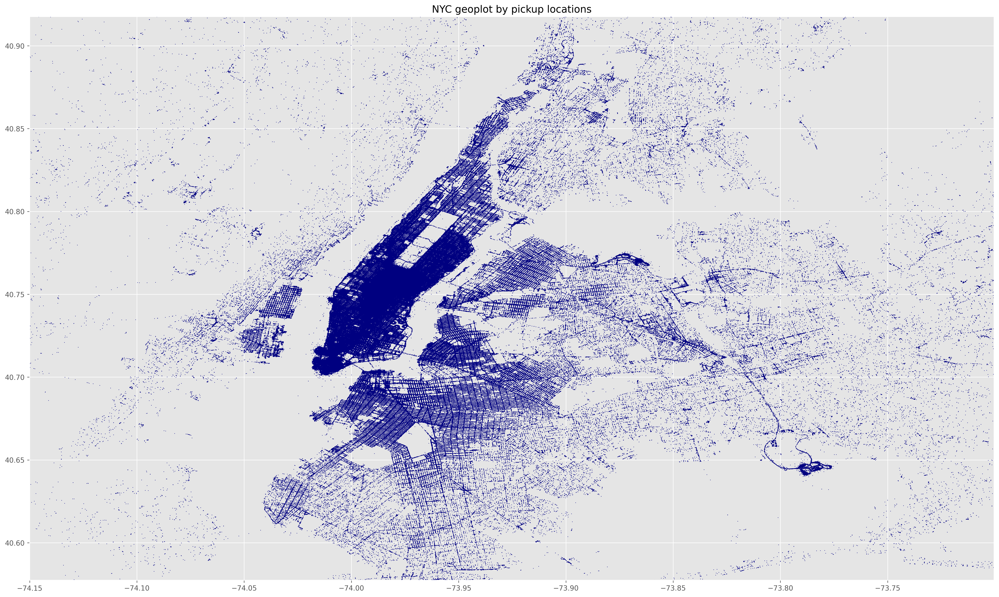

In [22]:
fig, ax = plt.subplots(figsize=(25,15), dpi=300)
ax.scatter(x=uber_data[['Lon']],y=uber_data[['Lat']], s=0.1, c='navy')
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

plt.title('NYC geoplot by pickup locations')
plt.show()

Representación general de la información, en la que se aprecia una mayor densidad de trabajo en la zona de Manhattan, seguida de Brookling y Queens

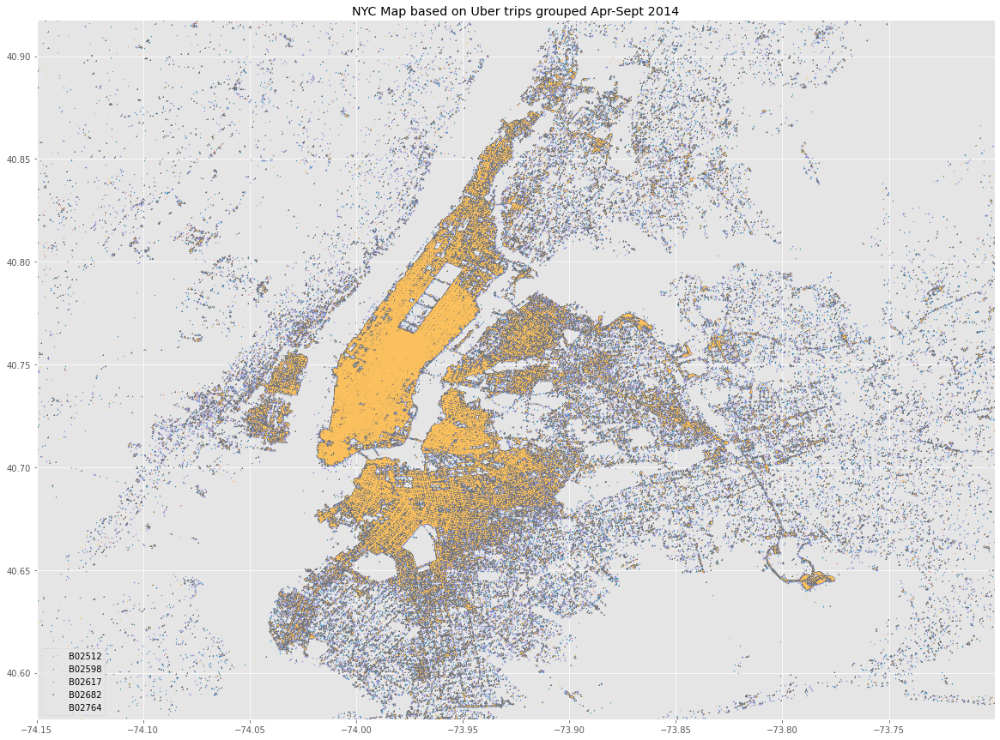

In [23]:
fig, ax = plt.subplots(figsize=(20,15))
ax.scatter(x=uber_data[uber_data['Base']==Bases[0]]['Lon'], y=uber_data[uber_data['Base'] == Bases[0]]['Lat'], s=0.5, marker='.')
ax.scatter(x=uber_data[uber_data['Base']==Bases[1]]['Lon'], y=uber_data[uber_data['Base'] == Bases[1]]['Lat'], s=1, marker='^')
ax.scatter(x=uber_data[uber_data['Base']==Bases[2]]['Lon'], y=uber_data[uber_data['Base'] == Bases[2]]['Lat'], s=1.5, marker='*')
ax.scatter(x=uber_data[uber_data['Base']==Bases[3]]['Lon'], y=uber_data[uber_data['Base'] == Bases[3]]['Lat'], s=1, marker='+')
ax.scatter(x=uber_data[uber_data['Base']==Bases[4]]['Lon'], y=uber_data[uber_data['Base'] == Bases[4]]['Lat'], s=0.5, marker='o')
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

plt.title('NYC Map based on Uber trips grouped Apr-Sept 2014')
plt.legend(Bases, loc=3)
plt.show()

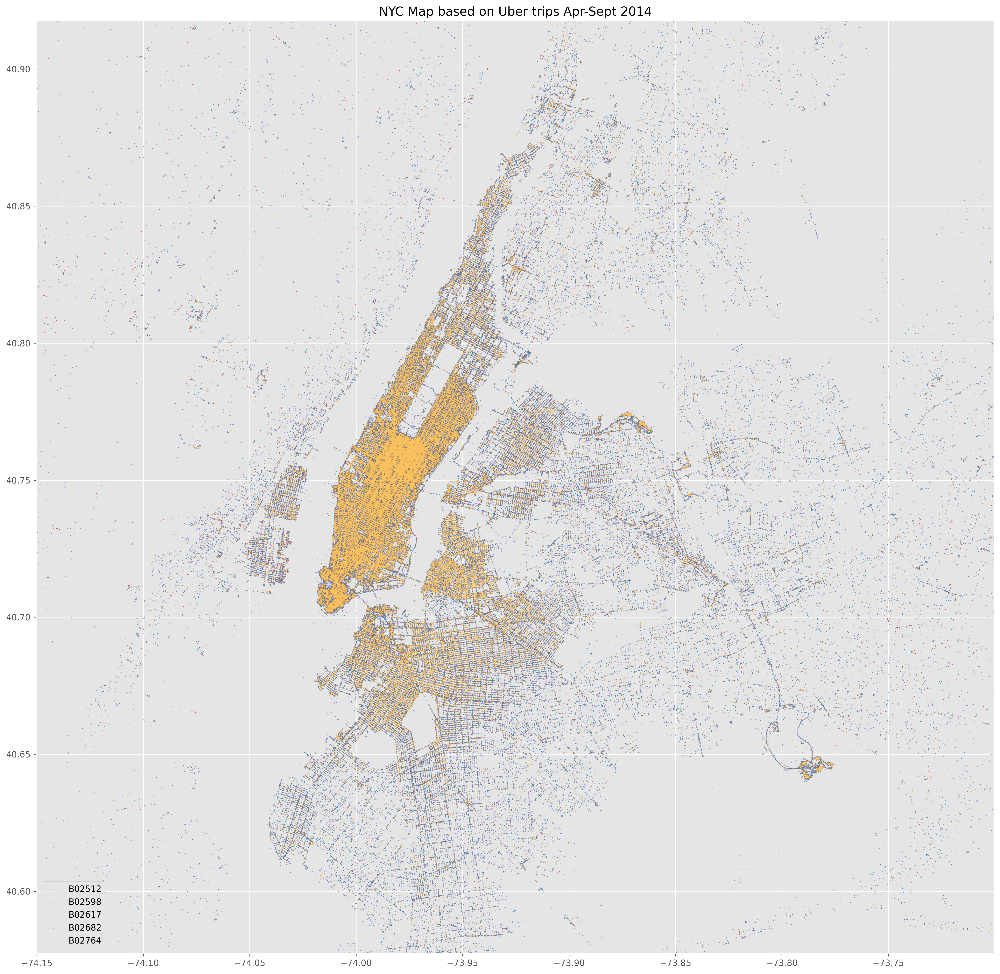

In [24]:
fig, ax = plt.subplots(figsize=(20,20), dpi=300)
ax.scatter(x=uber_data[uber_data['Base']==Bases[0]]['Lon'], y=uber_data[uber_data['Base'] == Bases[0]]['Lat'], s=0.3, marker='.')
ax.scatter(x=uber_data[uber_data['Base']==Bases[1]]['Lon'], y=uber_data[uber_data['Base'] == Bases[1]]['Lat'], s=0.3, marker='.')
ax.scatter(x=uber_data[uber_data['Base']==Bases[2]]['Lon'], y=uber_data[uber_data['Base'] == Bases[2]]['Lat'], s=0.3, marker='.')
ax.scatter(x=uber_data[uber_data['Base']==Bases[3]]['Lon'], y=uber_data[uber_data['Base'] == Bases[3]]['Lat'], s=0.3, marker='.')
ax.scatter(x=uber_data[uber_data['Base']==Bases[4]]['Lon'], y=uber_data[uber_data['Base'] == Bases[4]]['Lat'], s=0.3, marker='.')
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

plt.title('NYC Map based on Uber trips Apr-Sept 2014')
plt.legend(Bases, loc=3)
plt.show()

Representación del mapa anterior segmentenado cada posición de recogida por la base a la que pertenece.

En general, lo extraido en este breve análisis es como el mes y el día de semana influyen en la manera en la que los neoyorquinos cogen un Uber.